In [1]:
# %pip install -U sentence-transformers
# %pip install plotly
from sentence_transformers import SentenceTransformer

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score
from sklearn.ensemble import IsolationForest

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

## Data

In [3]:
df = pd.read_csv("../data/preprocessed_data.csv")
# df.drop_duplicates(subset="speeches", inplace=True)
df.head()

,speaker_id,speeches,party_id,party_name,county,orientation,sex
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F


## Sentence Embedding

In [4]:
sentence_model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

speeches = df["speeches"]
X = sentence_model.encode(speeches)

## Dimensional Reduction

In [5]:
dim = 2

# reductor = PCA(dim)
reductor = TSNE(dim)

X_emb = reductor.fit_transform(X)
df[[f"x{i}" for i in range(dim)]] = X_emb
df.head()

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,-10.948379,-42.492004
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,-11.961802,-34.506020
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,-9.440490,-41.768776
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,-10.554381,-40.931522
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,-27.865837,-24.883753


## Clustering

In [6]:
ks = []
calinski = []
inertias = []

for k in range(3, 18):
    model = KMeans(k)
    clusters = model.fit_predict(X_emb)

    ks.append(k)
    inertias.append(model.inertia_)
    calinski.append(calinski_harabasz_score(X_emb, clusters))

best_i = np.argmax(calinski)
best_k = ks[best_i]

C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\clust

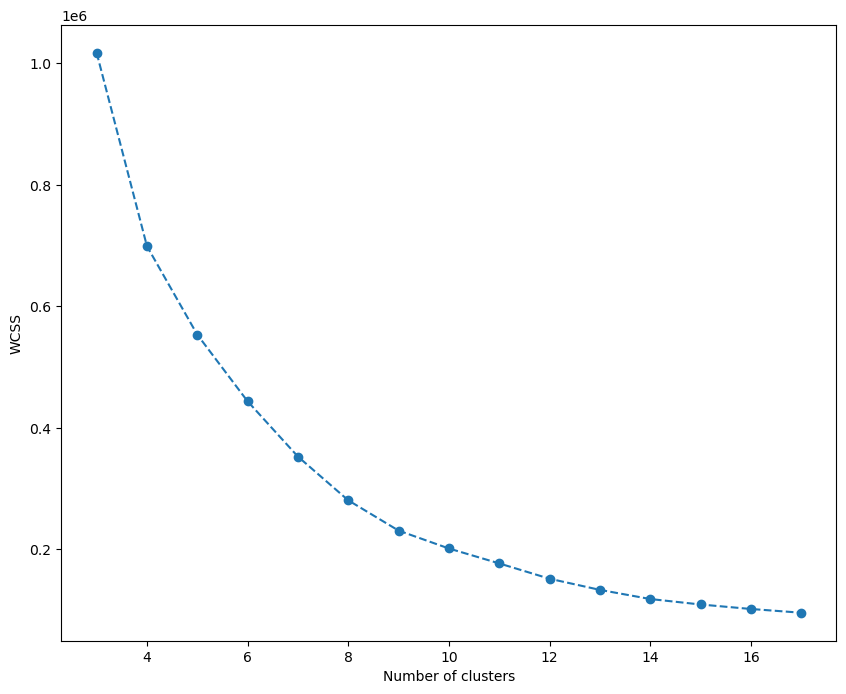

In [7]:
plt.figure(figsize=(10, 8))
plt.plot(ks, inertias, marker='o', linestyle='--')
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")

plt.show()

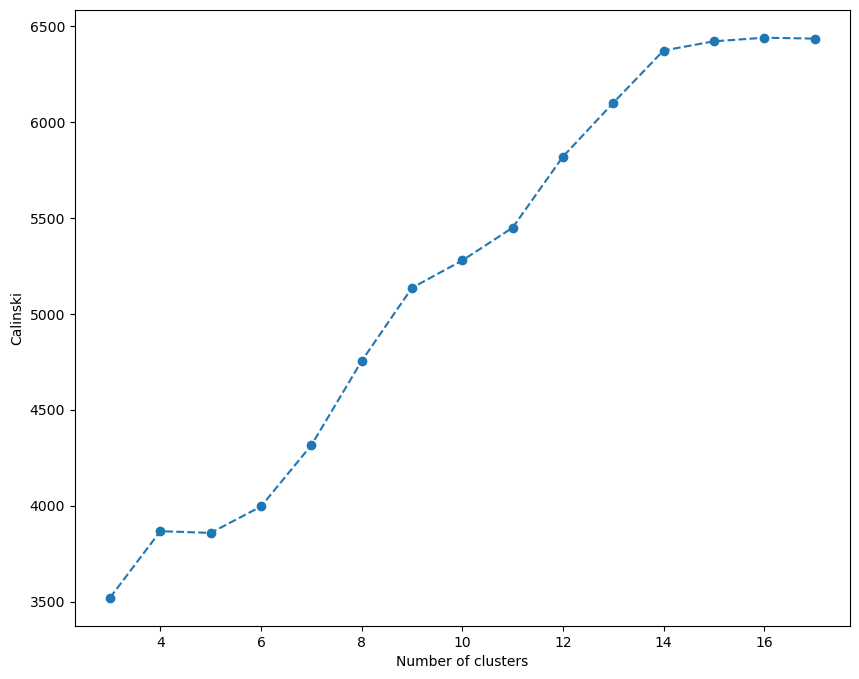

In [8]:
plt.figure(figsize=(10, 8))
plt.plot(ks, calinski, marker='o', linestyle='--')
plt.xlabel("Number of clusters")
plt.ylabel("Calinski")

plt.show()

In [9]:
selected_k = 7

model = KMeans(selected_k)
clusters = model.fit_predict(X_emb)

df["cluster"] = clusters
df.head()

C:\Users\ruben\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,-10.948379,-42.492004,5
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,-11.961802,-34.506020,5
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,-9.440490,-41.768776,5
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,-10.554381,-40.931522,5
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,-27.865837,-24.883753,1


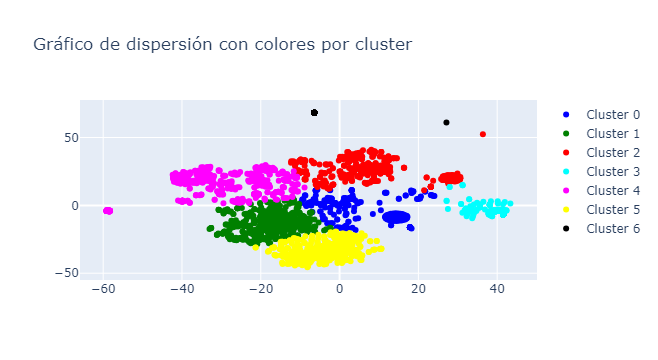

In [10]:
import plotly.graph_objects as go

colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'white', 'orange', 'purple', 'pink', 'gray', 'brown']
color_dict = dict(zip(range(len(colors)), colors))

fig = go.Figure()
for cluster in range(selected_k):
    cluster_data = df[df['cluster'] == cluster]
    fig.add_trace(go.Scatter(
        x=cluster_data['x0'],
        y=cluster_data['x1'],
        mode='markers',
        marker=dict(color=color_dict[cluster]),
        name=f'Cluster {cluster}',
        text=cluster_data['speeches']
    ))

fig.update_layout(
    title='Gráfico de dispersión con colores por cluster',
)

fig.show()

In [15]:
df.to_csv("clusters.csv", index=False)

In [13]:
from wordcloud import WordCloud
from collections import Counter
from spacy.lang.en import English


def get_freqs(sentences, stopwords):
    counter = Counter()
    nlp = English()
    tokenizer = nlp.tokenizer

    for sentence in sentences:
        try:
            for word in tokenizer(sentence):
                if word.text.lower() not in stopwords:
                    counter[word.text.lower()] += 1
        except Exception as e:
            print(e)

    return counter

In [16]:
with open("../data/stopwordlist_en.txt", 'r') as f:
    stopwords = f.read().split("\n")

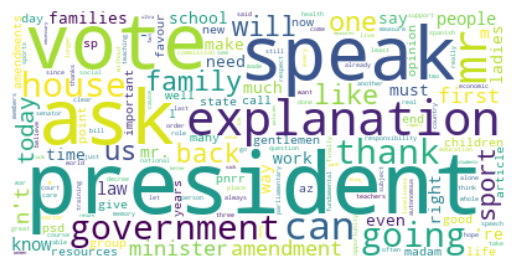

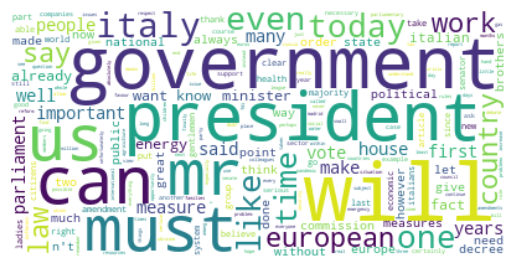

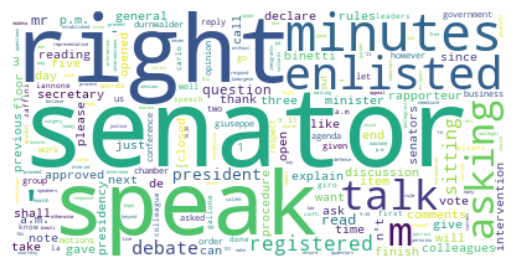

Argument 'string' has incorrect type (expected str, got float)
Argument 'string' has incorrect type (expected str, got float)


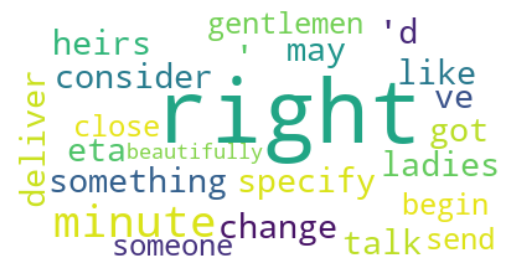

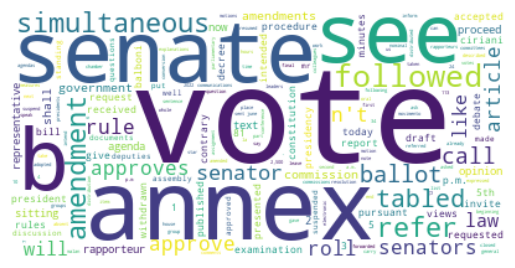

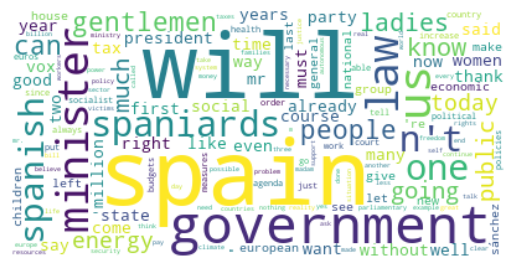

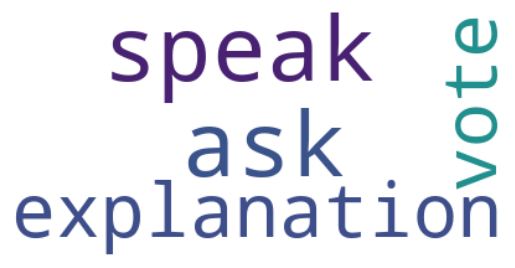

In [18]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]["speeches"]
    freqs = get_freqs(cluster_i, stopwords)
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(freqs)
    
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig(f"../out/cluster{i}.png")
    plt.show()

In [19]:
for i in range(selected_k):
    cluster_i = df[df["cluster"]==i]
    cluster_i.to_csv(f"../out/cluster{i}.csv", index=False)

In [25]:
df

,speaker_id,speeches,party_id,party_name,county,orientation,sex,x0,x1,cluster
0,#MireiaBorrásPabón,Good afternoon ladies and gentlemen Mr Echeniq...,#party.Vox,Vox,ES,#orientation.RRF,F,-10.948379,-42.492004,5
1,#MireiaBorrásPabón,Thank you President Good morning ladies and ge...,#party.Vox,Vox,ES,#orientation.RRF,F,-11.961802,-34.506020,5
2,#MireiaBorrásPabón,Thank you President Good afternoon deputies Th...,#party.Vox,Vox,ES,#orientation.RRF,F,-9.440490,-41.768776,5
3,#MireiaBorrásPabón,Thank you President Good afternoon ladies and ...,#party.Vox,Vox,ES,#orientation.RRF,F,-10.554381,-40.931522,5
4,#MireiaBorrásPabón,In what part of the menu are the worms and pro...,#party.Vox,Vox,ES,#orientation.RRF,F,-27.865837,-24.883753,1
...,...,...,...,...,...,...,...,...,...,...
2980,#BossiSimone,BOSSI Simone L SP PSd Az Mr President unfortun...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,-22.016598,-26.868223,1
2981,#BossiSimone,Mr President Mr Undersecretary ladies and gent...,#group.L-SP,Lega-Salvini Premier,IT,#orientation.RRF,M,-12.369558,-15.596534,1
2982,#PetrengaGiovanna,I ask you to speak for an explanation of vote,#group.FdI,Fratelli d'Italia,IT,#orientation.RRF,F,-6.431734,68.253578,6
2983,#PetrengaGiovanna,PETRENGA FdI Mr President today we are debatin...,#group.FdI,Fratelli d'Italia,IT,#orientation.RRF,F,-10.173784,-5.371727,1


In [32]:

for k in range(selected_k):
    print(f"Cluster {k}!")
    cluster_k = df[df["cluster"]==k]

    print(cluster_k.groupby("sex").count().iloc[:,0])
    print(cluster_k.groupby("county").count().iloc[:,0])
    print()
    print()

Cluster 0!
sex
F     68
M    240
Name: speaker_id, dtype: int64
county
ES     73
IT    235
Name: speaker_id, dtype: int64


Cluster 1!
sex
F     81
M    437
Name: speaker_id, dtype: int64
county
ES     42
IT    476
Name: speaker_id, dtype: int64


Cluster 2!
sex
F     15
M    483
Name: speaker_id, dtype: int64
county
ES      3
IT    495
Name: speaker_id, dtype: int64


Cluster 3!
sex
F      2
M    589
Name: speaker_id, dtype: int64
county
ES      6
IT    585
Name: speaker_id, dtype: int64


Cluster 4!
sex
F      3
M    549
Name: speaker_id, dtype: int64
county
ES      7
IT    545
Name: speaker_id, dtype: int64


Cluster 5!
sex
F    157
M    296
Name: speaker_id, dtype: int64
county
ES    426
IT     27
Name: speaker_id, dtype: int64


Cluster 6!
sex
F     8
M    57
Name: speaker_id, dtype: int64
county
IT    65
Name: speaker_id, dtype: int64


